In [1]:
#main data file and import script for class group 6  project 1
# Author AO ottoaara@gmail.com. 952.693.1378 
# 5.5.23
# data source mpls open data https://opendata.minneapolismn.gov/datasets/cityoflakes::crime-data/explore?location=19.216823%2C-46.664577%2C4.00
# CSV option under Crime Data Header
import pandas as pd
import csv
import json
import matplotlib as pyplot
import geopandas as gpd
from shapely.geometry import Point, Polygon
import cartopy.crs as ccrs
import geoviews as gv #noqa
import pyproj
import hvplot.pandas

#crime_data_main  = full data set (75 Megs so seperated out into groups for ease of dev)
#ran_crime_data_df is a light 1000 rows of data randomly choosen from crime_data_man to work with
#crime_data_2019 = data for 2019 
#crime_data_2020 ...
#crime_data_2021 ...
#crime_data_2022...
##crime_data_2023 = data for 2023 
filename = "Crime_Data.csv"
#csvdatapath = "Data/" + filename

In [2]:
# download local from repo to desktop (clone to your desktop)
#this reads the csv file 
crime_data_main = pd.read_csv(filename)

In [3]:
crime_data_main2 = crime_data_main.head (100)
crime_data_main2

,X,Y,Type,Case_Number,Case_NumberAlt,Reported_Date,Occurred_Date,NIBRS_Crime_Against,NIBRS_Group,NIBRS_Code,...,Address,Precinct,Neighborhood,Ward,Latitude,Longitude,wgsXAnon,wgsYAnon,Crime_Count,OBJECTID
0,-93.239958,44.969918,Additional Crime Metrics,19-005590,MP20195590,2019/01/06 17:35:00+00,2019/01/06 16:40:00+00,Non NIBRS Data,Non NIBRS Data,Non NIBRS Data,...,0021XX 4TH ST S,1.0,Cedar Riverside,2.0,44.96992,-93.23996,-1.037942e+07,5.616787e+06,1,1
1,-93.305717,45.015933,Additional Crime Metrics,19-007812,MP20197812,2019/01/08 21:17:00+00,2019/01/08 20:30:00+00,Non NIBRS Data,Non NIBRS Data,Non NIBRS Data,...,0033XX NEWTON AVE N,4.0,Folwell,4.0,45.01593,-93.30572,-1.038674e+07,5.624030e+06,1,2
2,-93.301225,45.035447,Additional Crime Metrics,19-020584,MP201920584,2019/01/22 00:13:00+00,2019/01/21 23:00:00+00,Non NIBRS Data,Non NIBRS Data,Non NIBRS Data,...,0016XX 44TH AVE N,4.0,Webber - Camden,4.0,45.03545,-93.30123,-1.038624e+07,5.627104e+06,1,3
3,-93.227268,44.899345,Additional Crime Metrics,19-033712,MP201933712,2019/02/04 14:55:00+00,2019/02/04 13:30:00+00,Non NIBRS Data,Non NIBRS Data,Non NIBRS Data,...,0057XX 31ST AVE S,3.0,Wenonah,11.0,44.89935,-93.22727,-1.037801e+07,5.605689e+06,1,4
4,-93.304439,45.004676,Additional Crime Metrics,19-034524,MP201934524,2019/02/05 12:46:00+00,2019/02/05 10:00:00+00,Non NIBRS Data,Non NIBRS Data,Non NIBRS Data,...,0024XX MORGAN AVE N,4.0,Jordan,5.0,45.00468,-93.30444,-1.038660e+07,5.622258e+06,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,-93.280671,44.891062,Additional Crime Metrics,19-026966,MP201926966,2019/01/28 18:02:00+00,2019/01/28 14:00:00+00,Non NIBRS Data,Non NIBRS Data,Non NIBRS Data,...,0061XX WENTWORTH AVE,5.0,Windom,11.0,44.89106,-93.28067,-1.038396e+07,5.604388e+06,1,96
96,-93.267698,45.030842,Additional Crime Metrics,19-203752,MP2019203752,2019/07/12 03:29:00+00,2019/07/12 01:49:00+00,Non NIBRS Data,Non NIBRS Data,Non NIBRS Data,...,0034XX MAIN ST NE,2.0,Columbia Park,1.0,45.03084,-93.26770,-1.038251e+07,5.626378e+06,1,97
97,-93.254778,45.024698,Additional Crime Metrics,19-174901,MP2019174901,2019/06/17 21:43:00+00,2019/06/17 19:20:00+00,Non NIBRS Data,Non NIBRS Data,Non NIBRS Data,...,0005XX SAINT ANTHONY PKWY,2.0,Columbia Park,1.0,45.02470,-93.25478,-1.038107e+07,5.625411e+06,1,98
98,-93.305717,45.015933,Additional Crime Metrics,19-210622,MP2019210622,2019/07/17 22:31:00+00,2019/07/17 21:11:00+00,Non NIBRS Data,Non NIBRS Data,Non NIBRS Data,...,0033XX NEWTON AVE N,4.0,Folwell,4.0,45.01593,-93.30572,-1.038674e+07,5.624030e+06,4,99


In [4]:
#columns listed for ease of co-development use. 
crime_data_main.columns

Index(['X', 'Y', 'Type', 'Case_Number', 'Case_NumberAlt', 'Reported_Date',
       'Occurred_Date', 'NIBRS_Crime_Against', 'NIBRS_Group', 'NIBRS_Code',
       'Offense_Category', 'Offense', 'Problem_Initial', 'Problem_Final',
       'Address', 'Precinct', 'Neighborhood', 'Ward', 'Latitude', 'Longitude',
       'wgsXAnon', 'wgsYAnon', 'Crime_Count', 'OBJECTID'],
      dtype='object')

In [5]:
#checkign data types 
crime_data_main.dtypes

X                      float64
Y                      float64
Type                    object
Case_Number             object
Case_NumberAlt          object
Reported_Date           object
Occurred_Date           object
NIBRS_Crime_Against     object
NIBRS_Group             object
NIBRS_Code              object
Offense_Category        object
Offense                 object
Problem_Initial         object
Problem_Final           object
Address                 object
Precinct               float64
Neighborhood            object
Ward                   float64
Latitude               float64
Longitude              float64
wgsXAnon               float64
wgsYAnon               float64
Crime_Count              int64
OBJECTID                 int64
dtype: object

In [6]:
crime_data_main['Occurred_Date'] = pd.to_datetime(crime_data_main['Occurred_Date'])

In [7]:
#get count of one column to prep for null value check 
crime_data_main["X"].count()

223121

In [8]:
# Remove rows containing all null values- cleaning data set
crime_data_clean = crime_data_main.dropna(how='any')

In [9]:
# removing rows with null values.  
crime_data_clean["X"].count()

149693

In [10]:
# checking values of crime category to reduce our data set down further to violent crimes 
crime_data_clean["Offense_Category"].unique()

array(['Subset of NIBRS Assault Offenses', 'Weapon Law Violations ',
       'Drug/Narcotic Offenses ', 'Assault Offenses ', 'Robbery ',
       'Counterfeiting/Forgery ', 'Burglary/Breaking & Entering ',
       'Larceny/Theft Offenses ', 'Fraud Offenses ',
       'Motor Vehicle Theft ', 'Sex Offenses ',
       'Stolen Property Offenses ', 'Subset of NIBRS Robbery',
       'Embezzlement ', 'Kidnapping/Abduction ', 'Human Trafficking ',
       'Pornography/Obscene Material ', 'Animal Cruelty ',
       'Extortion/Blackmail ', 'Homicide Offenses ',
       'Destruction/Damage/Vandalism of Property ', 'Arson ', 'Bribery ',
       'Prostitution Offenses ', 'Gambling Offenses ',
       'Gunshot Wound Victims', 'Shots Fired Calls'], dtype=object)

In [11]:
# reducing the data sets to only have violent crimes in them.  Note Included motor vehicle theft due to the
# high volumme of car-jackings occuring in mpls. 

crime_categories = [
    #'Subset of NIBRS Assault Offenses',
    'Assault Offenses ',
    #'Larceny/Theft Offenses ',
    'Sex Offenses ',
    'Robbery ',
    #'Burglary/Breaking & Entering ',
    #'Motor Vehicle Theft ',
    #'Weapon Law Violations ',
    'Kidnapping/Abduction ',
    'Homicide Offenses ',
    'Human Trafficking ',
    'Gunshot Wound Victims ',
    #'Shots Fired Calls'
]

#crime_data_clean = crime_data_clean[crime_data_clean['Offense_Category'].isin(crime_categories)]


In [12]:
#changing Occured_Date filed to data/time from object
crime_data_clean['Occurred_Date'] = pd.to_datetime(crime_data_clean['Occurred_Date'])


/var/folders/xh/4tzf2qqj3cn9c2g0yyfptlbr0000gn/T/ipykernel_60413/2250024751.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_data_clean['Occurred_Date'] = pd.to_datetime(crime_data_clean['Occurred_Date'])


In [13]:
#checking to make sure date/time conv worked 
crime_data_clean.dtypes

X                                  float64
Y                                  float64
Type                                object
Case_Number                         object
Case_NumberAlt                      object
Reported_Date                       object
Occurred_Date          datetime64[ns, UTC]
NIBRS_Crime_Against                 object
NIBRS_Group                         object
NIBRS_Code                          object
Offense_Category                    object
Offense                             object
Problem_Initial                     object
Problem_Final                       object
Address                             object
Precinct                           float64
Neighborhood                        object
Ward                               float64
Latitude                           float64
Longitude                          float64
wgsXAnon                           float64
wgsYAnon                           float64
Crime_Count                          int64
OBJECTID   

In [14]:
#building random data set 
# n_samples = min(1000, len(crime_data_clean))
# ran_crime_data_df = crime_data_clean.sample(n=n_samples, random_state=42)

In [15]:
#crime_data_2019["Offense_Category"].unique()

In [16]:
#building year data sets
crime_data_2019 = crime_data_main[crime_data_main['Occurred_Date'].dt.year == 2019]

crime_data_2020 = crime_data_main[crime_data_main['Occurred_Date'].dt.year == 2020]

crime_data_2021 = crime_data_main[crime_data_main['Occurred_Date'].dt.year == 2021]

crime_data_2022 = crime_data_main[crime_data_main['Occurred_Date'].dt.year == 2022]

crime_data_2023 = crime_data_main[crime_data_main['Occurred_Date'].dt.year == 2023]

#crime_data_2022.dtypes

#crime_data_2020['Occurred_Date'].unique()

#crime_data_2023['Offense_Category'].unique()

#len(crime_data_2019),len(crime_data_2020), len(crime_data_2021),len(crime_data_2022),len(crime_data_2023)

In [17]:
#reducing data sets to viloent crimes
crime_data_2019 = crime_data_2019[crime_data_2019['Offense_Category'].isin(crime_categories)]

crime_data_2020 = crime_data_2020[crime_data_2020['Offense_Category'].isin(crime_categories)]

crime_data_2021 = crime_data_2021[crime_data_2021['Offense_Category'].isin(crime_categories)]

crime_data_2022 = crime_data_2022[crime_data_2022['Offense_Category'].isin(crime_categories)]

crime_data_2023 = crime_data_2023[crime_data_2023['Offense_Category'].isin(crime_categories)]

len(crime_data_2019), len(crime_data_2020), len(crime_data_2021), len(crime_data_2022)

#crime_data_2022["Offense_Category"].unique()
#crime_data_2022['Occurred_Date'].unique()
#crime_data_2022['Offense_Category']

(10298, 10555, 10473, 10726)

In [18]:
crime_data_2019.dtypes

X                                  float64
Y                                  float64
Type                                object
Case_Number                         object
Case_NumberAlt                      object
Reported_Date                       object
Occurred_Date          datetime64[ns, UTC]
NIBRS_Crime_Against                 object
NIBRS_Group                         object
NIBRS_Code                          object
Offense_Category                    object
Offense                             object
Problem_Initial                     object
Problem_Final                       object
Address                             object
Precinct                           float64
Neighborhood                        object
Ward                               float64
Latitude                           float64
Longitude                          float64
wgsXAnon                           float64
wgsYAnon                           float64
Crime_Count                          int64
OBJECTID   

In [19]:
# grouping with smaller data set to look at where the crimes are happening - counting number of offenses 
#grouped_data = crime_data_clearn.groupby(['Neighborhood', 'Address']).size().reset_index(name='Offense_Count')
grouped_data = crime_data_clean.groupby(['Neighborhood', 'Address', 'Offense_Category']).size().reset_index(name='Offense_Count')


In [20]:
#sorting grouped data to show the worst parts of town ie sorting by places more than one offense occurred
sorted_grouped_data = grouped_data.sort_values(by='Offense_Count', ascending=False)


In [21]:
# viewing sorted data frame. 
sorted_grouped_data

,Neighborhood,Address,Offense_Category,Offense_Count
27392,Northeast Park,0014XX NEW BRIGHTON BLVD,Larceny/Theft Offenses,485
18484,Longfellow,0025XX LAKE ST E,Larceny/Theft Offenses,360
12396,Hawthorne,0021XX ALDRICH AVE N,Assault Offenses,341
8425,East Phillips,0024XX 18TH AVE S,Assault Offenses,301
7136,Downtown West,0009XX NICOLLET MALL,Larceny/Theft Offenses,299
...,...,...,...,...
18054,Linden Hills,0041XX EWING AVE S,Assault Offenses,1
18053,Linden Hills,0041XX CHOWEN AVE S,Larceny/Theft Offenses,1
18052,Linden Hills,0041XX CHOWEN AVE S,Burglary/Breaking & Entering,1
18048,Linden Hills,0041XX ABBOTT AVE S,Larceny/Theft Offenses,1


In [22]:
# adding in date time to support further analysis to check correlation between time and offense
grouped_data_bydate = crime_data_clean.groupby(['Neighborhood', 'Address', 'Offense_Category', 'Occurred_Date']).size().reset_index(name='Offense_Count')


In [23]:
grouped_data_bydate

,Neighborhood,Address,Offense_Category,Occurred_Date,Offense_Count
0,Armatage,0019XX 60TH ST W,Larceny/Theft Offenses,2021-08-25 10:00:00+00:00,1
1,Armatage,0020XX 60TH ST W,Motor Vehicle Theft,2020-06-08 22:45:00+00:00,1
2,Armatage,0021XX 53RD ST W,Assault Offenses,2019-06-29 19:00:00+00:00,1
3,Armatage,0021XX 53RD ST W,Assault Offenses,2019-07-08 15:29:00+00:00,1
4,Armatage,0021XX 53RD ST W,Assault Offenses,2020-06-25 00:00:00+00:00,1
...,...,...,...,...,...
148391,Windom Park,0025XX ARTHUR ST NE,Sex Offenses,2021-07-21 12:00:00+00:00,1
148392,Windom Park,0025XX ARTHUR ST NE,Sex Offenses,2022-02-03 12:00:00+00:00,1
148393,Windom Park,19TH AVE NE / GARFIELD ST NE,Motor Vehicle Theft,2023-01-04 23:00:00+00:00,1
148394,Windom Park,24TH AVE NE / FILLMORE ST NE,Larceny/Theft Offenses,2023-03-24 22:27:00+00:00,1


In [24]:
# viewing sorted data frame. 
sorted_grouped_data = grouped_data_bydate.sort_values(by='Offense_Count', ascending=False)
sorted_grouped_data

,Neighborhood,Address,Offense_Category,Occurred_Date,Offense_Count
24695,Downtown West,0009XX 4TH ST S,Pornography/Obscene Material,2021-01-30 00:00:00+00:00,37
24690,Downtown West,0009XX 4TH ST S,Pornography/Obscene Material,2020-01-30 00:00:00+00:00,26
22634,Downtown West,0005XX 4TH AVE S,Pornography/Obscene Material,2021-01-30 00:00:00+00:00,18
52353,Holland,0007XX 23RD AVE NE,Destruction/Damage/Vandalism of Property,2023-02-22 01:00:00+00:00,11
8083,Central,0004XX LAKE ST E,Robbery,2020-05-28 00:05:00+00:00,9
...,...,...,...,...,...
49695,Hawthorne,0028XX DUPONT AVE N,Motor Vehicle Theft,2022-06-29 17:23:00+00:00,1
49696,Hawthorne,0028XX DUPONT AVE N,Motor Vehicle Theft,2022-11-12 07:30:00+00:00,1
49697,Hawthorne,0028XX DUPONT AVE N,Shots Fired Calls,2020-11-26 02:57:05+00:00,1
49698,Hawthorne,0028XX DUPONT AVE N,Weapon Law Violations,2020-08-01 16:00:00+00:00,1


In [25]:
# adding long and lat. for analysis by location 
crime_data_byLongLat = grouped_data_bydate.merge(
    crime_data_clean[['Neighborhood', 'Address', 'Latitude', 'Longitude']],
    on=['Neighborhood', 'Address'],
    how='left')

In [26]:
crime_data_byLongLat

,Neighborhood,Address,Offense_Category,Occurred_Date,Offense_Count,Latitude,Longitude
0,Armatage,0019XX 60TH ST W,Larceny/Theft Offenses,2021-08-25 10:00:00+00:00,1,44.89430,-93.30421
1,Armatage,0020XX 60TH ST W,Motor Vehicle Theft,2020-06-08 22:45:00+00:00,1,44.89431,-93.30545
2,Armatage,0021XX 53RD ST W,Assault Offenses,2019-06-29 19:00:00+00:00,1,44.90693,-93.30675
3,Armatage,0021XX 53RD ST W,Assault Offenses,2019-06-29 19:00:00+00:00,1,44.90693,-93.30675
4,Armatage,0021XX 53RD ST W,Assault Offenses,2019-06-29 19:00:00+00:00,1,44.90693,-93.30675
...,...,...,...,...,...,...,...
19585428,Windom Park,19TH AVE NE / GARFIELD ST NE,Motor Vehicle Theft,2023-01-04 23:00:00+00:00,1,45.00778,-93.23332
19585429,Windom Park,24TH AVE NE / FILLMORE ST NE,Larceny/Theft Offenses,2023-03-24 22:27:00+00:00,1,45.01219,-93.24224
19585430,Windom Park,24TH AVE NE / FILLMORE ST NE,Larceny/Theft Offenses,2023-03-24 22:27:00+00:00,1,45.01219,-93.24224
19585431,Windom Park,24TH AVE NE / FILLMORE ST NE,Stolen Property Offenses,2023-03-24 22:27:00+00:00,1,45.01219,-93.24224


In [27]:
#display 2019 crime data
crime_data_2019["Type"].unique()

array(['Crime Offenses (NIBRS)'], dtype=object)

In [28]:
#Configure plot map for 2019
map_plot_2019 = crime_data_2019.hvplot.points(
    "Longitude",
    "Latitude",
    geo = True, 
    tiles = True, 
    frame_width = 600,
    frame_height = 600,
    c = "Offense_Category"
)

#Display the map plot
map_plot_2019

#len(crime_data_2019)


:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (Offense_Category)

In [29]:
#Configure plot map for 2020
map_plot_2020 = crime_data_2020.hvplot.points(
    "Longitude",
    "Latitude",
    geo = True, 
    tiles = True, 
    frame_width = 600,
    frame_height = 600,
    c = "Offense_Category"
    
)

#Display the map plot
map_plot_2020

#len(crime_data_2020)

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (Offense_Category)

In [30]:
#Configure plot map for 2021
map_plot_2021 = crime_data_2021.hvplot.points(
    "Longitude",
    "Latitude",
    geo = True, 
    tiles = True, 
    frame_width = 600,
    frame_height = 600,
    c = "Offense_Category"
)

#Display the map plot
map_plot_2021

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (Offense_Category)

In [31]:
#Configure plot map for 2022
map_plot_2022 = crime_data_2022.hvplot.points(
    "Longitude",
    "Latitude",
    geo = True, 
    tiles = True, 
    frame_width = 600,
    frame_height = 600,
    c = "Offense_Category"
)

#Display the map plot
map_plot_2022

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (Offense_Category)

In [32]:
#Configure plot map for 2023
map_plot_2023 = crime_data_2023.hvplot.points(
    "Longitude",
    "Latitude",
    geo = True, 
    tiles = True, 
    frame_width = 600,
    frame_height = 600,
    c = "Offense_Category"
)

#Display the map plot
map_plot_2023

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (Offense_Category)

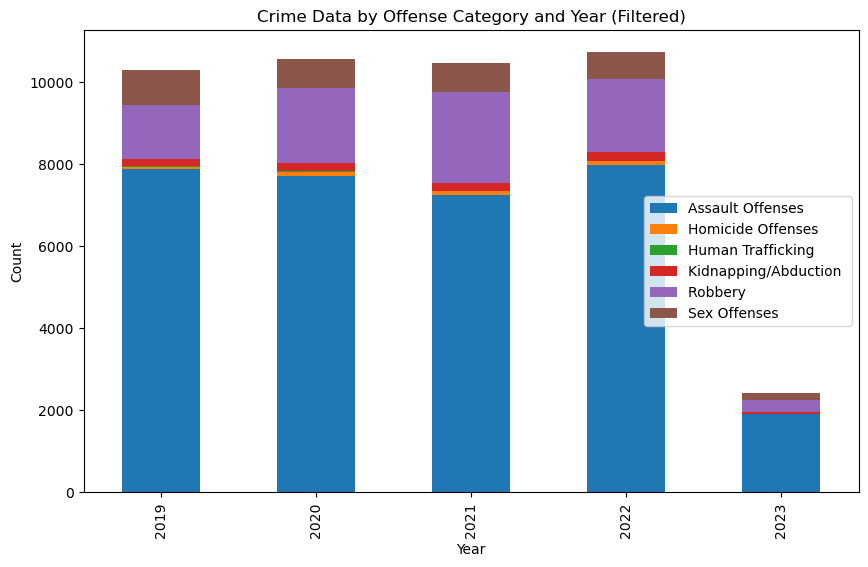

In [45]:

import matplotlib.pyplot as plt

# Filter the DataFrame to include only offense categories found in crime_categories
crime_data_filtered = crime_data_main[crime_data_main['Offense_Category'].isin(crime_categories)]

# Filter the DataFrame to include only rows with occurred dates between 2019 and 2023
crime_data_filtered = crime_data_filtered[(crime_data_filtered['Occurred_Date'].dt.year >= 2019) & (crime_data_filtered['Occurred_Date'].dt.year <= 2023)]

# Extract the year from 'Occurred_Date' and create a new column
crime_data_filtered['Year'] = crime_data_filtered['Occurred_Date'].dt.year

# Group the filtered data by 'Year' and 'Offense_Category' and count the occurrences
grouped_data = crime_data_filtered.groupby(['Year', 'Offense_Category']).size().reset_index(name='Count')

# Pivot the data to have 'Year' as the index, 'Offense_Category' as the columns, and 'Count' as the values
pivot_data = grouped_data.pivot(index='Year', columns='Offense_Category', values='Count')

# Plot the pivot_data as a stacked bar chart
pivot_data.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Crime Data by Offense Category and Year (Filtered)')
plt.legend()
plt.show()



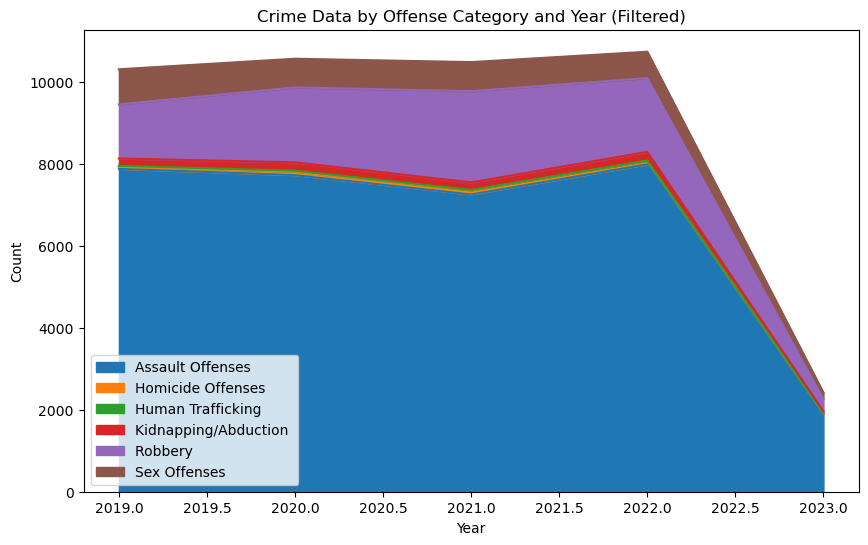

In [46]:
pivot_data.plot(kind='area', figsize=(10, 6))
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Crime Data by Offense Category and Year (Filtered)')
plt.legend()
plt.show()

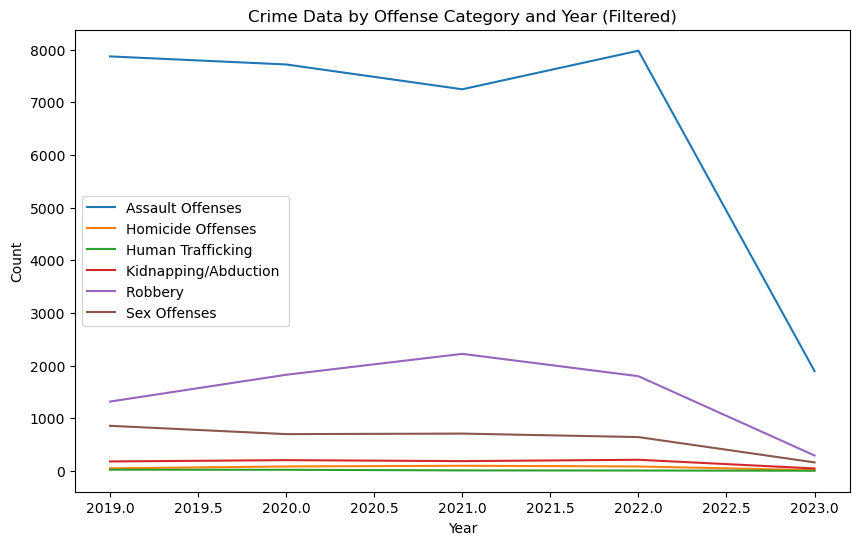

In [47]:
pivot_data.plot(kind='line', figsize=(10, 6))
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Crime Data by Offense Category and Year (Filtered)')
plt.legend()
plt.show()

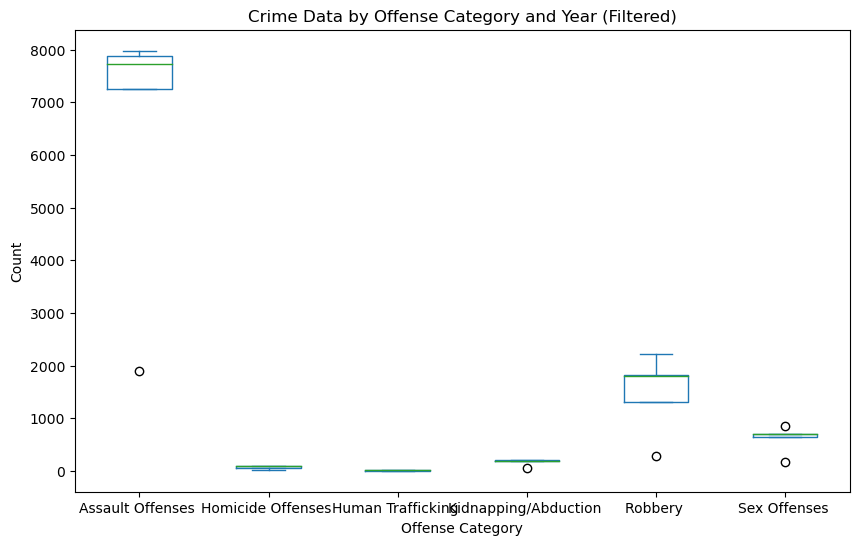

In [48]:
pivot_data.plot(kind='box', figsize=(10, 6))
plt.xlabel('Offense Category')
plt.ylabel('Count')
plt.title('Crime Data by Offense Category and Year (Filtered)')
plt.show()

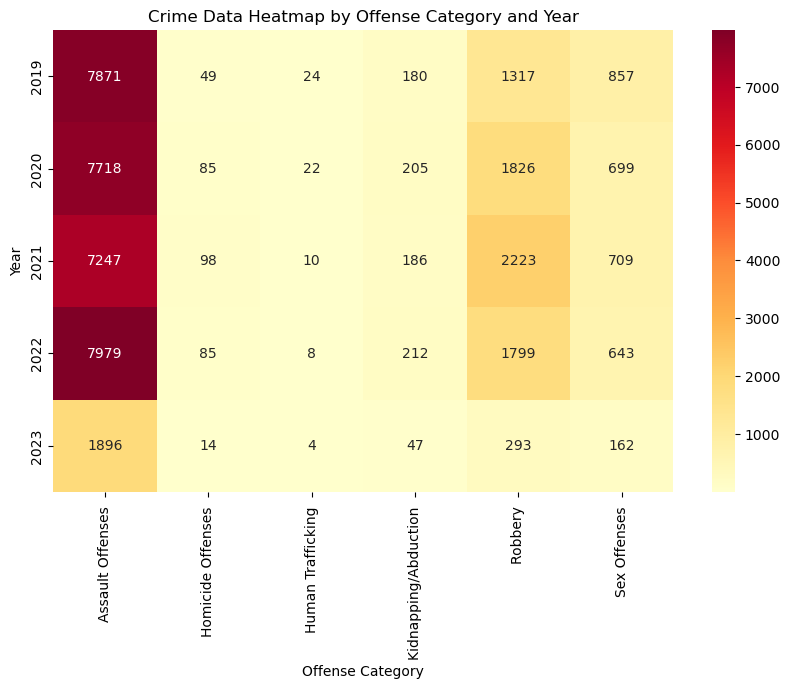

In [49]:
# bringin seaborn
import seaborn as sns
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_data, cmap='YlOrRd', annot=True, fmt='d', cbar=True)
plt.xlabel('Offense Category')
plt.ylabel('Year')
plt.title('Crime Data Heatmap by Offense Category and Year')
plt.show()


In [51]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook

# Enable Bokeh for Jupyter Notebook
output_notebook()

# Create a scatter plot using Bokeh
p = figure(title='Crime Data Heatmap', x_axis_label='Longitude', y_axis_label='Latitude')
p.scatter(crime_data_main['Longitude'], crime_data_main['Latitude'], color='red')

# Show the plot
show(p)


Loading BokehJS ...

In [56]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.palettes import Category10

output_notebook()

# Create a Bokeh figure
p = figure(plot_height=400, plot_width=800, title='Crime Data by Offense Category and Year (Filtered)', toolbar_location=None,
           x_axis_label='Year', y_axis_label='Count')

# Create a list of colors for each offense category
colors = Category10[len(pivot_data.columns)]

# Plot lines for each offense category
for category, color in zip(pivot_data.columns, colors):
    p.line(pivot_data.index, pivot_data[category], line_color=color, legend_label=category)

# Add a legend
p.legend.location = 'top_left'

show(p)


Loading BokehJS ...

In [59]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.palettes import Category10
from bokeh.models import Legend

output_notebook()

# Create a Bokeh figure
p = figure(x_range=list(map(str, pivot_data.index)), plot_height=400, plot_width=800,
           title='Crime Data by Offense Category and Year (Filtered)', toolbar_location=None,
           x_axis_label='Year', y_axis_label='Count')

# Create a list of colors for each offense category
colors = Category10[len(pivot_data.columns)]

# Plot stacked areas
areas = p.varea_stack(stackers=list(pivot_data.columns), x='Year', color=colors, source=pivot_data,
                      legend_label=list(pivot_data.columns))

# Create a legend
legend = Legend(items=[(category, [area]) for category, area in zip(pivot_data.columns, areas)], location='top_left')
p.add_layout(legend, 'right')

show(p)



Loading BokehJS ...

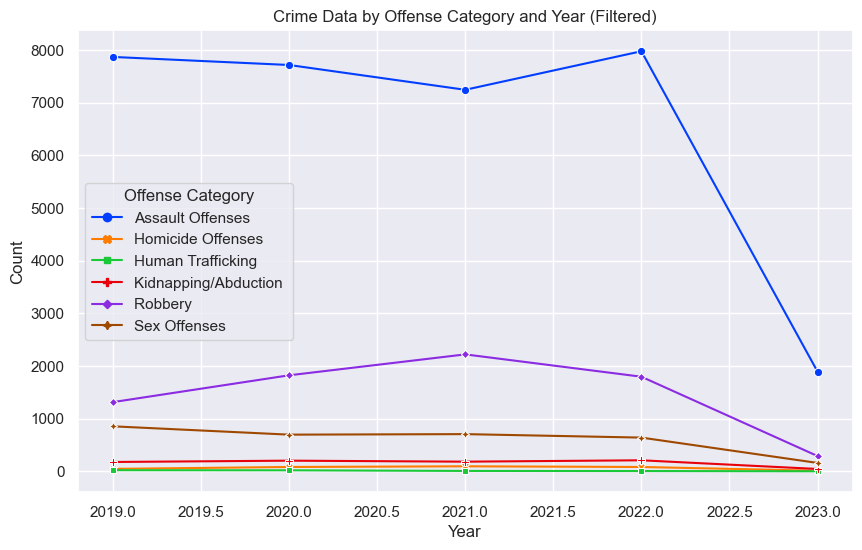

In [61]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set()

# Create a line chart using seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(data=pivot_data, dashes=False, markers=True, palette='bright')
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Crime Data by Offense Category and Year (Filtered)')
plt.legend(title='Offense Category')

plt.show()



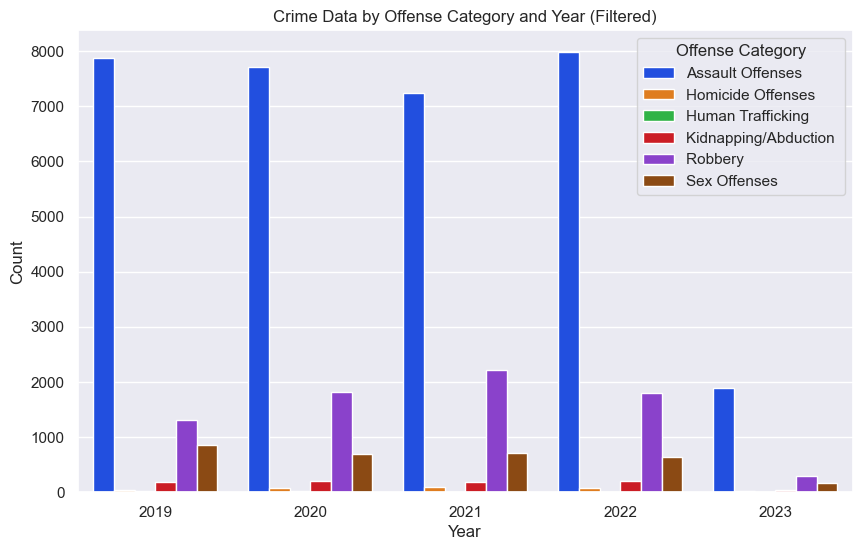

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set()

# Create a grouped bar chart using seaborn
plt.figure(figsize=(10, 6))
sns.barplot(data=grouped_data, x='Year', y='Count', hue='Offense_Category', palette='bright')
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Crime Data by Offense Category and Year (Filtered)')
plt.legend(title='Offense Category')

plt.show()


AttributeError: 'Line2D' object has no property 'fill'

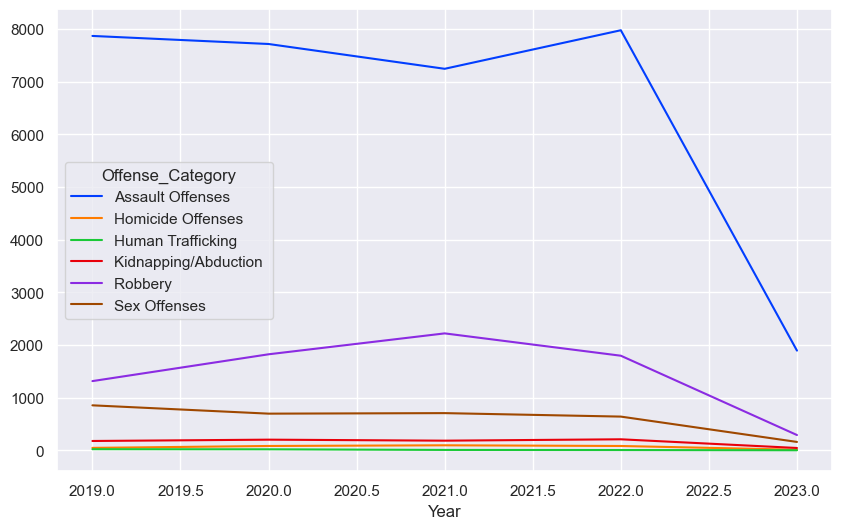

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set()

# Create an area chart using seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(data=pivot_data, dashes=False, markers=False, palette='bright')
sns.lineplot(data=pivot_data, dashes=False, markers=False, palette='bright', estimator=None, fill=True)
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Crime Data by Offense Category and Year (Filtered)')
plt.legend(title='Offense Category')

plt.show()


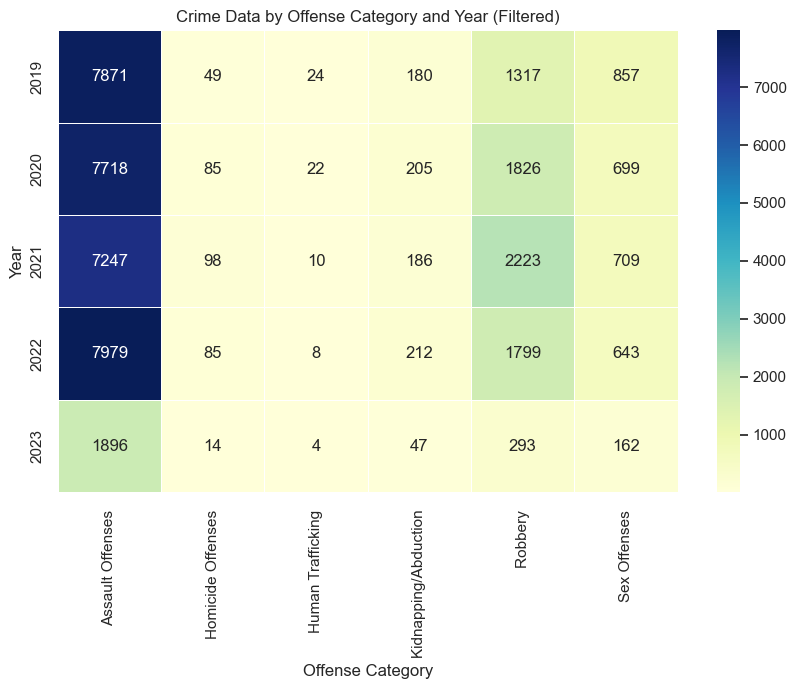

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set()

# Create a heatmap using seaborn
plt.figure(figsize=(10, 6))
sns.heatmap(data=pivot_data, cmap='YlGnBu', annot=True, fmt='d', linewidths=0.5)
plt.xlabel('Offense Category')
plt.ylabel('Year')
plt.title('Crime Data by Offense Category and Year (Filtered)')

plt.show()
